<a href="https://colab.research.google.com/github/ndahlquist/pytorch-fourier-feature-networks/blob/notebook/demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, let's try fitting a function to produce the image as a function of (X,Y) image coordinates. We'll start with the naive approach, and then introduce the Gaussian Fourier Feature mapping.

This is a Pytorch adaptation of the original notebook here: https://github.com/tancik/fourier-feature-networks/blob/master/Demo.ipynb.

In [2]:
#@title Imports and Boilerplate

import urllib.request

import torch

import torch.nn as nn
import tqdm

import numpy as np
import cv2

import cv2
import imageio
import torch
import numpy as np
from tqdm.notebook import tqdm as tqdm
from torch import nn
import matplotlib.pyplot as plt

def tensor_to_numpy(tensor: torch.Tensor) -> np.ndarray:
    tensor = tensor * 256
    tensor[tensor > 255] = 255
    tensor[tensor < 0] = 0
    tensor = tensor.type(torch.uint8).permute(1, 2, 0).cpu().numpy()

    return tensor

def get_image(url='https://live.staticflickr.com/7492/15677707699_d9d67acf9d_b.jpg'):
    image_url = url
    img = imageio.imread(image_url)[..., :3] / 255.
    c = [img.shape[0] // 2, img.shape[1] // 2]
    r = 256
    img = img[c[0] - r:c[0] + r, c[1] - r:c[1] + r]

    return img

Setup the input and target for our model.

# Model and training code

Our model is a coordinate-based multilayer perceptron. In this example, for each input image coordinate $(x,y)$, the model predicts the associated color $(r,g,b)$.

![Network diagram](https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png)

Note: we use 2D convolutions, but because they have a kernel size of (1, 1), they are acting as "pointwise" convolutions. This is equivalent to a densely connected multilayer perceptron for each coordinate.

Also, we use batchnorm to speed up convergence.

In [73]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train_network(B, img, RES, subset, desc, lr=1e-3):
  first = RES//subset * 2
  if B is None:
    first = 2
  elif B.shape[-2] == 2:
    first = 4
  model = nn.Sequential(
        nn.Linear(
            first,
            RES//subset),
        nn.ReLU(),

        nn.Linear(
            RES//subset,
            RES//subset),
        nn.ReLU(),

        nn.Linear(
            RES//subset,
            RES//subset),
        nn.ReLU(),

        nn.Linear(
            RES//subset,
            3),
        nn.Sigmoid(),

    ).to(device)

  coords = np.linspace(0, 1, RES+1)[:-1]
  xy_grid = np.stack(np.meshgrid(coords, coords), axis=-1)
  
  xy_grid = torch.tensor(xy_grid).unsqueeze(0).float().contiguous().to(device)
 
  
  xy_train = xy_grid[:,::subset,::subset]

 
  y = torch.tensor(img[::subset,::subset]).float().unsqueeze(0).to(device)
  img = torch.tensor(img).float().unsqueeze(0).to(device)
  
  
  #print(y.shape)
  #print(img.shape)
  epochs = []
  psnr_epoch = []

  optimizer = torch.optim.Adam(list(model.parameters()), lr=lr)

  for epoch in tqdm(range(1,2001)):
      model.train()
      optimizer.zero_grad()

      if B is None:
        x = xy_train
      else:
        x = torch.cat([torch.sin((2.*np.pi*xy_train) @ B.T), torch.cos((2.*np.pi*xy_train) @ B.T)], axis=-1).float().to(device)

      generated = model(x)

      loss = 0.5* torch.nn.MSELoss()(generated, y)
      psnr = -10. * np.log10(2.0*float(loss))
      loss.backward()
      optimizer.step()

      if epoch % 25 == 0:
        epochs.append(epoch)
        psnr_epoch.append(psnr)

      if epoch % 100 == 0:
        model.eval()
        print('Epoch %d, loss = %.03f, psnr = %.02f' % (epoch, float(loss), psnr))
  
  model.eval()    
  if B is None:
    pred = model(xy_grid)
  else:
    pred = model(torch.cat([torch.sin(2.*np.pi*xy_grid @ B.T), torch.cos(2.*np.pi*xy_grid @ B.T)], axis=-1).float().to(device))
  #print(pred.shape)
  pred_loss = 0.5 * torch.nn.MSELoss()(pred, img)
  pred_psnr = -10.0 * np.log10(2.0*float(pred_loss))
  pred_img = pred[0].cpu().detach().numpy()
  #plt.title(desc)
  #plt.show()
    
  return (model, pred_psnr, pred_img, psnr, epochs, psnr_epoch)

B = torch.randn((256, 2)).to(device) * 10.0
#train_network(B, img)

In [5]:
import os
visualize = True #@param {type:"boolean"}

load_div2k = True #@param {type:"boolean"}
load_text = True #@param {type:"boolean"}

RES = 512

def load_dataset(filename, id):
    if not os.path.exists(filename):
        !gdown --id $id

    npz_data = np.load(filename)
    out = {
        "data_grid_search":npz_data['train_data'] / 255.,
        "data_test":npz_data['test_data'] / 255.,
    }
    return out

datasets = {}
if load_div2k:
    datasets['div2k'] = load_dataset('data_div2k.npz', '1TtwlEDArhOMoH18aUyjIMSZ3WODFmUab')
if load_text:
    datasets['text'] = load_dataset('data_2d_text.npz', '1V-RQJcMuk9GD4JCUn70o7nwQE0hEzHoT')

Downloading...
From: https://drive.google.com/uc?id=1TtwlEDArhOMoH18aUyjIMSZ3WODFmUab
To: /content/data_div2k.npz
100% 25.2M/25.2M [00:00<00:00, 118MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1V-RQJcMuk9GD4JCUn70o7nwQE0hEzHoT
To: /content/data_2d_text.npz
100% 25.2M/25.2M [00:00<00:00, 153MB/s]


In [6]:
posenc_scale = 6
embedding_size = 256
bvals = 2.**np.linspace(0,posenc_scale,embedding_size//2) - 1
bvals = np.stack([bvals, np.zeros_like(bvals)], -1)
bvals = np.concatenate([bvals, np.roll(bvals, 1, axis=-1)], 0) + 0

In [65]:
enc = {}

In [66]:
enc['None'] = (None, 1e-2)
enc['basic'] = (torch.tensor(np.eye(2)).float().contiguous().to(device), 1e-2)
enc['posenc_new'] = (torch.tensor(bvals).float().contiguous().to(device), 1e-3)

In [67]:
Bb = torch.randn((256, 2)).to(device) 
enc['gaussian_1'] = (Bb, 1e-3)
enc['gaussian_10'] = (Bb * 10.0, 1e-3)
enc['gaussian_14'] = (Bb * 14.0, 1e-3)


In [26]:
scales = [1.0, 2.0, 4.0, 8.0, 10.0, 14.0, 16.0, 32.0, 64.0]
B = torch.randn((256, 2)).to(device)
img = datasets['div2k']['data_test'][9]
outputs = []
for s in tqdm(scales):
  outputs.append(train_network(B*s, img, 512, 2, f"Scale {s}"))

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.012, psnr = 16.21
Epoch 200, loss = 0.010, psnr = 16.79
Epoch 300, loss = 0.009, psnr = 17.30
Epoch 400, loss = 0.009, psnr = 17.25
Epoch 500, loss = 0.008, psnr = 17.77
Epoch 600, loss = 0.009, psnr = 17.62
Epoch 700, loss = 0.008, psnr = 17.90
Epoch 800, loss = 0.008, psnr = 18.08
Epoch 900, loss = 0.008, psnr = 18.22
Epoch 1000, loss = 0.008, psnr = 18.06
Epoch 1100, loss = 0.007, psnr = 18.31
Epoch 1200, loss = 0.007, psnr = 18.58
Epoch 1300, loss = 0.007, psnr = 18.66
Epoch 1400, loss = 0.007, psnr = 18.53
Epoch 1500, loss = 0.007, psnr = 18.69
Epoch 1600, loss = 0.007, psnr = 18.79
Epoch 1700, loss = 0.007, psnr = 18.55
Epoch 1800, loss = 0.007, psnr = 18.69
Epoch 1900, loss = 0.007, psnr = 18.61
Epoch 2000, loss = 0.006, psnr = 19.01


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.009, psnr = 17.35
Epoch 200, loss = 0.009, psnr = 17.66
Epoch 300, loss = 0.007, psnr = 18.47
Epoch 400, loss = 0.007, psnr = 18.57
Epoch 500, loss = 0.007, psnr = 18.74
Epoch 600, loss = 0.006, psnr = 19.31
Epoch 700, loss = 0.006, psnr = 19.45
Epoch 800, loss = 0.006, psnr = 19.49
Epoch 900, loss = 0.006, psnr = 19.51
Epoch 1000, loss = 0.005, psnr = 19.80
Epoch 1100, loss = 0.006, psnr = 19.45
Epoch 1200, loss = 0.005, psnr = 19.65
Epoch 1300, loss = 0.005, psnr = 20.02
Epoch 1400, loss = 0.006, psnr = 19.11
Epoch 1500, loss = 0.005, psnr = 20.38
Epoch 1600, loss = 0.005, psnr = 19.89
Epoch 1700, loss = 0.005, psnr = 19.76
Epoch 1800, loss = 0.005, psnr = 20.33
Epoch 1900, loss = 0.005, psnr = 19.99
Epoch 2000, loss = 0.005, psnr = 20.14


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.007, psnr = 18.62
Epoch 200, loss = 0.005, psnr = 19.85
Epoch 300, loss = 0.005, psnr = 20.24
Epoch 400, loss = 0.004, psnr = 20.90
Epoch 500, loss = 0.004, psnr = 20.98
Epoch 600, loss = 0.004, psnr = 21.06
Epoch 700, loss = 0.004, psnr = 21.32
Epoch 800, loss = 0.003, psnr = 21.72
Epoch 900, loss = 0.003, psnr = 21.57
Epoch 1000, loss = 0.003, psnr = 21.97
Epoch 1100, loss = 0.003, psnr = 22.31
Epoch 1200, loss = 0.003, psnr = 22.34
Epoch 1300, loss = 0.003, psnr = 22.31
Epoch 1400, loss = 0.003, psnr = 22.39
Epoch 1500, loss = 0.003, psnr = 22.66
Epoch 1600, loss = 0.003, psnr = 22.02
Epoch 1700, loss = 0.003, psnr = 22.53
Epoch 1800, loss = 0.003, psnr = 22.16
Epoch 1900, loss = 0.003, psnr = 22.73
Epoch 2000, loss = 0.002, psnr = 23.02


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.004, psnr = 20.56
Epoch 200, loss = 0.003, psnr = 22.17
Epoch 300, loss = 0.002, psnr = 23.53
Epoch 400, loss = 0.002, psnr = 24.31
Epoch 500, loss = 0.002, psnr = 24.88
Epoch 600, loss = 0.001, psnr = 25.24
Epoch 700, loss = 0.001, psnr = 25.90
Epoch 800, loss = 0.001, psnr = 26.32
Epoch 900, loss = 0.002, psnr = 25.10
Epoch 1000, loss = 0.001, psnr = 26.90
Epoch 1100, loss = 0.001, psnr = 26.20
Epoch 1200, loss = 0.001, psnr = 26.16
Epoch 1300, loss = 0.002, psnr = 24.13
Epoch 1400, loss = 0.001, psnr = 27.76
Epoch 1500, loss = 0.001, psnr = 27.69
Epoch 1600, loss = 0.001, psnr = 26.61
Epoch 1700, loss = 0.001, psnr = 28.29
Epoch 1800, loss = 0.001, psnr = 26.64
Epoch 1900, loss = 0.001, psnr = 27.85
Epoch 2000, loss = 0.001, psnr = 25.81


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.004, psnr = 21.29
Epoch 200, loss = 0.003, psnr = 22.37
Epoch 300, loss = 0.002, psnr = 24.83
Epoch 400, loss = 0.001, psnr = 25.42
Epoch 500, loss = 0.001, psnr = 26.58
Epoch 600, loss = 0.001, psnr = 27.02
Epoch 700, loss = 0.001, psnr = 26.53
Epoch 800, loss = 0.001, psnr = 28.55
Epoch 900, loss = 0.001, psnr = 27.69
Epoch 1000, loss = 0.001, psnr = 28.83
Epoch 1100, loss = 0.001, psnr = 28.28
Epoch 1200, loss = 0.001, psnr = 29.91
Epoch 1300, loss = 0.001, psnr = 29.22
Epoch 1400, loss = 0.000, psnr = 30.32
Epoch 1500, loss = 0.000, psnr = 31.12
Epoch 1600, loss = 0.001, psnr = 30.00
Epoch 1700, loss = 0.000, psnr = 30.48
Epoch 1800, loss = 0.001, psnr = 25.93
Epoch 1900, loss = 0.000, psnr = 30.21
Epoch 2000, loss = 0.000, psnr = 32.03


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.003, psnr = 22.47
Epoch 200, loss = 0.002, psnr = 24.10
Epoch 300, loss = 0.001, psnr = 27.14
Epoch 400, loss = 0.001, psnr = 28.46
Epoch 500, loss = 0.001, psnr = 28.53
Epoch 600, loss = 0.000, psnr = 30.52
Epoch 700, loss = 0.000, psnr = 31.26
Epoch 800, loss = 0.000, psnr = 31.51
Epoch 900, loss = 0.000, psnr = 31.25
Epoch 1000, loss = 0.000, psnr = 32.55
Epoch 1100, loss = 0.000, psnr = 31.36
Epoch 1200, loss = 0.000, psnr = 32.59
Epoch 1300, loss = 0.000, psnr = 30.90
Epoch 1400, loss = 0.000, psnr = 31.34
Epoch 1500, loss = 0.000, psnr = 33.13
Epoch 1600, loss = 0.000, psnr = 30.91
Epoch 1700, loss = 0.000, psnr = 33.17
Epoch 1800, loss = 0.000, psnr = 34.56
Epoch 1900, loss = 0.000, psnr = 33.87
Epoch 2000, loss = 0.000, psnr = 35.13


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.003, psnr = 22.69
Epoch 200, loss = 0.001, psnr = 25.78
Epoch 300, loss = 0.001, psnr = 27.57
Epoch 400, loss = 0.001, psnr = 29.45
Epoch 500, loss = 0.000, psnr = 30.05
Epoch 600, loss = 0.000, psnr = 31.53
Epoch 700, loss = 0.000, psnr = 32.09
Epoch 800, loss = 0.001, psnr = 29.08
Epoch 900, loss = 0.000, psnr = 32.01
Epoch 1000, loss = 0.001, psnr = 29.30
Epoch 1100, loss = 0.000, psnr = 34.12
Epoch 1200, loss = 0.000, psnr = 33.60
Epoch 1300, loss = 0.000, psnr = 34.84
Epoch 1400, loss = 0.000, psnr = 32.95
Epoch 1500, loss = 0.000, psnr = 32.39
Epoch 1600, loss = 0.000, psnr = 33.42
Epoch 1700, loss = 0.000, psnr = 35.13
Epoch 1800, loss = 0.000, psnr = 30.02
Epoch 1900, loss = 0.000, psnr = 30.01
Epoch 2000, loss = 0.000, psnr = 36.01


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.002, psnr = 24.73
Epoch 200, loss = 0.001, psnr = 28.47
Epoch 300, loss = 0.000, psnr = 30.40
Epoch 400, loss = 0.000, psnr = 32.01
Epoch 500, loss = 0.000, psnr = 31.59
Epoch 600, loss = 0.000, psnr = 33.50
Epoch 700, loss = 0.000, psnr = 34.24
Epoch 800, loss = 0.000, psnr = 34.41
Epoch 900, loss = 0.000, psnr = 35.52
Epoch 1000, loss = 0.000, psnr = 35.31
Epoch 1100, loss = 0.000, psnr = 35.83
Epoch 1200, loss = 0.000, psnr = 36.69
Epoch 1300, loss = 0.000, psnr = 30.33
Epoch 1400, loss = 0.000, psnr = 36.86
Epoch 1500, loss = 0.000, psnr = 35.52
Epoch 1600, loss = 0.000, psnr = 37.74
Epoch 1700, loss = 0.000, psnr = 37.73
Epoch 1800, loss = 0.000, psnr = 37.73
Epoch 1900, loss = 0.000, psnr = 38.38
Epoch 2000, loss = 0.000, psnr = 30.64


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.004, psnr = 20.92
Epoch 200, loss = 0.003, psnr = 22.80
Epoch 300, loss = 0.002, psnr = 24.97
Epoch 400, loss = 0.001, psnr = 26.63
Epoch 500, loss = 0.001, psnr = 28.02
Epoch 600, loss = 0.001, psnr = 29.05
Epoch 700, loss = 0.001, psnr = 29.89
Epoch 800, loss = 0.000, psnr = 30.59
Epoch 900, loss = 0.000, psnr = 31.19
Epoch 1000, loss = 0.000, psnr = 30.28
Epoch 1100, loss = 0.000, psnr = 32.11
Epoch 1200, loss = 0.000, psnr = 31.97
Epoch 1300, loss = 0.000, psnr = 31.97
Epoch 1400, loss = 0.000, psnr = 32.43
Epoch 1500, loss = 0.000, psnr = 32.94
Epoch 1600, loss = 0.000, psnr = 34.09
Epoch 1700, loss = 0.000, psnr = 33.61
Epoch 1800, loss = 0.000, psnr = 34.88
Epoch 1900, loss = 0.000, psnr = 30.84
Epoch 2000, loss = 0.000, psnr = 35.20


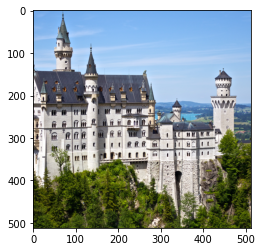

In [ ]:
plt.imshow(datasets['div2k']['data_test'][9])
plt.show()

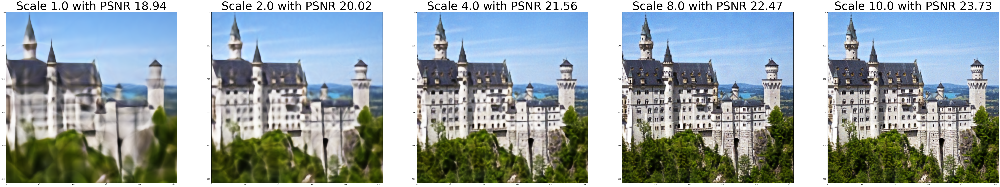

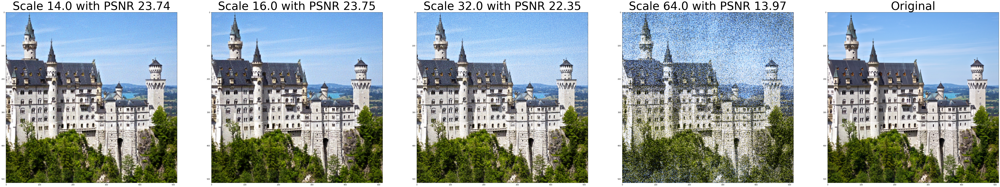

In [27]:
plt.figure(figsize=(100,32))
for i in range(5):
  p = outputs[i][2]
  plt.subplot(1,5,i+1)
  plt.imshow(p)
  plt.title(f'Scale {scales[i]} with PSNR {outputs[i][1]:.2f}', fontdict={'fontsize':64})
plt.savefig("Trial1.png")
plt.figure(figsize=(100,32))
for i in range(5,9):
  p = outputs[i][2]
  plt.subplot(1,5,i+1-5)
  plt.imshow(p)
  plt.title(f'Scale {scales[i]} with PSNR {outputs[i][1]:.2f}',fontdict={'fontsize':64})
plt.subplot(1,5,5)
plt.imshow(img)
plt.title("Original",fontdict={'fontsize':64})
plt.savefig("Trial2.png")
#plt.show()


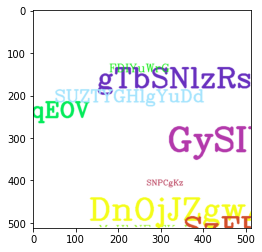

In [ ]:
img = datasets['text']['data_test'][9]
plt.imshow(img)
plt.show()

In [87]:
outputs = []
img = datasets['div2k']['data_test'][9]
for k in tqdm(enc):
  print(k)
  B = enc[k][0]
  lr = enc[k][1]
  outputs.append(train_network(B, img, 512, 2, "", lr))
  

  0%|          | 0/6 [00:00<?, ?it/s]

None


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.017, psnr = 14.81
Epoch 200, loss = 0.015, psnr = 15.12
Epoch 300, loss = 0.015, psnr = 15.32
Epoch 400, loss = 0.014, psnr = 15.47
Epoch 500, loss = 0.014, psnr = 15.59
Epoch 600, loss = 0.013, psnr = 15.72
Epoch 700, loss = 0.013, psnr = 15.84
Epoch 800, loss = 0.013, psnr = 15.87
Epoch 900, loss = 0.012, psnr = 16.05
Epoch 1000, loss = 0.012, psnr = 16.15
Epoch 1100, loss = 0.013, psnr = 15.78
Epoch 1200, loss = 0.012, psnr = 16.35
Epoch 1300, loss = 0.012, psnr = 16.26
Epoch 1400, loss = 0.011, psnr = 16.45
Epoch 1500, loss = 0.011, psnr = 16.43
Epoch 1600, loss = 0.012, psnr = 16.38
Epoch 1700, loss = 0.011, psnr = 16.56
Epoch 1800, loss = 0.011, psnr = 16.52
Epoch 1900, loss = 0.011, psnr = 16.66
Epoch 2000, loss = 0.010, psnr = 16.79
basic


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.014, psnr = 15.66
Epoch 200, loss = 0.011, psnr = 16.53
Epoch 300, loss = 0.010, psnr = 16.92
Epoch 400, loss = 0.009, psnr = 17.22
Epoch 500, loss = 0.009, psnr = 17.55
Epoch 600, loss = 0.009, psnr = 17.67
Epoch 700, loss = 0.008, psnr = 17.71
Epoch 800, loss = 0.008, psnr = 17.89
Epoch 900, loss = 0.008, psnr = 17.91
Epoch 1000, loss = 0.008, psnr = 17.79
Epoch 1100, loss = 0.008, psnr = 18.03
Epoch 1200, loss = 0.007, psnr = 18.25
Epoch 1300, loss = 0.008, psnr = 18.13
Epoch 1400, loss = 0.007, psnr = 18.44
Epoch 1500, loss = 0.007, psnr = 18.28
Epoch 1600, loss = 0.007, psnr = 18.55
Epoch 1700, loss = 0.007, psnr = 18.54
Epoch 1800, loss = 0.007, psnr = 18.58
Epoch 1900, loss = 0.007, psnr = 18.70
Epoch 2000, loss = 0.007, psnr = 18.78
posenc_new


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.003, psnr = 21.57
Epoch 200, loss = 0.002, psnr = 24.07
Epoch 300, loss = 0.001, psnr = 25.39
Epoch 400, loss = 0.001, psnr = 25.68
Epoch 500, loss = 0.001, psnr = 27.22
Epoch 600, loss = 0.001, psnr = 27.58
Epoch 700, loss = 0.001, psnr = 26.33
Epoch 800, loss = 0.001, psnr = 27.80
Epoch 900, loss = 0.001, psnr = 29.10
Epoch 1000, loss = 0.001, psnr = 29.89
Epoch 1100, loss = 0.001, psnr = 29.59
Epoch 1200, loss = 0.000, psnr = 30.13
Epoch 1300, loss = 0.001, psnr = 27.93
Epoch 1400, loss = 0.000, psnr = 30.12
Epoch 1500, loss = 0.000, psnr = 30.39
Epoch 1600, loss = 0.000, psnr = 30.71
Epoch 1700, loss = 0.000, psnr = 30.38
Epoch 1800, loss = 0.000, psnr = 31.52
Epoch 1900, loss = 0.000, psnr = 32.10
Epoch 2000, loss = 0.000, psnr = 30.58
gaussian_1


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.012, psnr = 16.15
Epoch 200, loss = 0.011, psnr = 16.77
Epoch 300, loss = 0.009, psnr = 17.24
Epoch 400, loss = 0.009, psnr = 17.55
Epoch 500, loss = 0.009, psnr = 17.69
Epoch 600, loss = 0.010, psnr = 16.83
Epoch 700, loss = 0.008, psnr = 18.02
Epoch 800, loss = 0.008, psnr = 18.15
Epoch 900, loss = 0.008, psnr = 18.15
Epoch 1000, loss = 0.007, psnr = 18.37
Epoch 1100, loss = 0.007, psnr = 18.29
Epoch 1200, loss = 0.008, psnr = 18.08
Epoch 1300, loss = 0.007, psnr = 18.33
Epoch 1400, loss = 0.007, psnr = 18.56
Epoch 1500, loss = 0.007, psnr = 18.69
Epoch 1600, loss = 0.007, psnr = 18.73
Epoch 1700, loss = 0.007, psnr = 18.83
Epoch 1800, loss = 0.006, psnr = 18.92
Epoch 1900, loss = 0.006, psnr = 18.99
Epoch 2000, loss = 0.007, psnr = 18.29
gaussian_10


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.004, psnr = 21.12
Epoch 200, loss = 0.002, psnr = 23.33
Epoch 300, loss = 0.002, psnr = 24.39
Epoch 400, loss = 0.002, psnr = 25.19
Epoch 500, loss = 0.001, psnr = 25.81
Epoch 600, loss = 0.001, psnr = 26.13
Epoch 700, loss = 0.001, psnr = 27.93
Epoch 800, loss = 0.001, psnr = 27.15
Epoch 900, loss = 0.001, psnr = 29.06
Epoch 1000, loss = 0.001, psnr = 26.75
Epoch 1100, loss = 0.001, psnr = 27.63
Epoch 1200, loss = 0.001, psnr = 28.80
Epoch 1300, loss = 0.001, psnr = 28.88
Epoch 1400, loss = 0.000, psnr = 30.26
Epoch 1500, loss = 0.000, psnr = 30.62
Epoch 1600, loss = 0.000, psnr = 30.84
Epoch 1700, loss = 0.001, psnr = 29.55
Epoch 1800, loss = 0.000, psnr = 31.86
Epoch 1900, loss = 0.000, psnr = 30.71
Epoch 2000, loss = 0.000, psnr = 31.61
gaussian_14


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 100, loss = 0.003, psnr = 21.92
Epoch 200, loss = 0.002, psnr = 24.83
Epoch 300, loss = 0.001, psnr = 26.54
Epoch 400, loss = 0.001, psnr = 28.18
Epoch 500, loss = 0.001, psnr = 29.52
Epoch 600, loss = 0.000, psnr = 30.15
Epoch 700, loss = 0.001, psnr = 26.45
Epoch 800, loss = 0.000, psnr = 30.83
Epoch 900, loss = 0.000, psnr = 32.13
Epoch 1000, loss = 0.000, psnr = 31.64
Epoch 1100, loss = 0.000, psnr = 33.07
Epoch 1200, loss = 0.001, psnr = 29.69
Epoch 1300, loss = 0.000, psnr = 33.77
Epoch 1400, loss = 0.000, psnr = 32.20
Epoch 1500, loss = 0.001, psnr = 28.61
Epoch 1600, loss = 0.000, psnr = 34.20
Epoch 1700, loss = 0.000, psnr = 30.47
Epoch 1800, loss = 0.000, psnr = 30.44
Epoch 1900, loss = 0.000, psnr = 34.71
Epoch 2000, loss = 0.000, psnr = 31.68


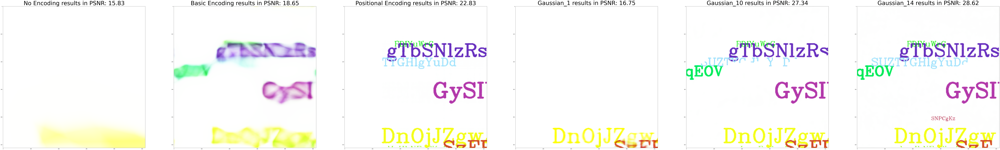

In [72]:
plt.figure(figsize=(200,32))
p = outputs[0][2]
plt.subplot(1,6,1)
plt.imshow(p)
plt.title(f'No Encoding results in PSNR: {outputs[0][1]:.2f}', fontdict={'fontsize':64})

p = outputs[1][2]
plt.subplot(1,6,2)
plt.imshow(p)
plt.title(f'Basic Encoding results in PSNR: {outputs[1][1]:.2f}', fontdict={'fontsize':64})

p = outputs[2][2]
plt.subplot(1,6,3)
plt.imshow(p)
plt.title(f'Positional Encoding results in PSNR: {outputs[2][1]:.2f}', fontdict={'fontsize':64})

p = outputs[3][2]
plt.subplot(1,6,4)
plt.imshow(p)
plt.title(f'Gaussian_1 results in PSNR: {outputs[3][1]:.2f}', fontdict={'fontsize':64})

p = outputs[4][2]
plt.subplot(1,6,5)
plt.imshow(p)
plt.title(f'Gaussian_10 results in PSNR: {outputs[4][1]:.2f}', fontdict={'fontsize':64})

p = outputs[5][2]
plt.subplot(1,6,6)
plt.imshow(p)
plt.title(f'Gaussian_14 results in PSNR: {outputs[5][1]:.2f}', fontdict={'fontsize':64})

plt.savefig("Text_best_comp.png")


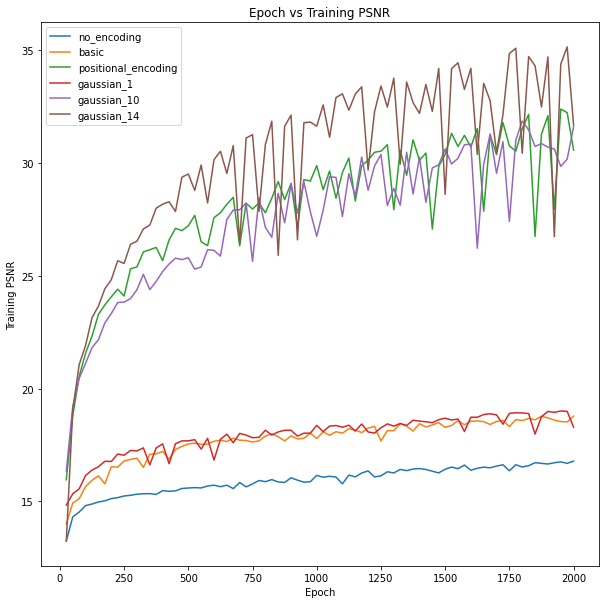

In [88]:
plt.figure(figsize=(10,10))
for i, k in enumerate(enc.keys()):
  o = outputs[i]
  if(k == 'None'):
    k = "no_encoding"
  elif(k == "posenc_new"):
    k = "positional_encoding"
  plt.plot(o[-2], o[-1], label=k)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Training PSNR")
plt.title("Epoch vs Training PSNR")
plt.savefig("Nature_PSNR.png")
plt.show()